# WNN Multimodal Integration - GSE164378 Dataset

## Overview
This notebook implements **Weighted-Nearest Neighbor (WNN)** analysis to integrate multiple data modalities from the GSE164378 dataset. WNN enables joint analysis of RNA-seq and protein (ADT) measurements to achieve higher resolution cell type identification.

## Dataset Source
This analysis reproduces methods from:

**"Integrated analysis of multimodal single-cell data"**  
*Hao et al., Cell (2021)*  
DOI: [10.1016/j.cell.2021.04.048](https://doi.org/10.1016/j.cell.2021.04.048)  
Paper URL: https://www.cell.com/cell/fulltext/S0092-8674(21)00583-3  
GEO Accession: [GSE164378](https://www.ncbi.nlm.nih.gov/geo/query/acc.cgi?acc=GSE164378)

## What is WNN?
**Weighted-Nearest Neighbor (WNN)** analysis addresses a key challenge in multimodal single-cell analysis: how to combine information from different data types (RNA, protein, etc.) that have different scales, noise profiles, and biological information content.

### Key Concepts:
- **Problem**: RNA-seq and protein measurements capture different but complementary information
- **Solution**: WNN learns modality-specific weights for each cell based on which modality is most informative
- **Result**: Integrated cell similarity graph that leverages strengths of each modality

### WNN Workflow:
1. Process each modality independently (RNA: PCA, ADT: PCA on CLR-normalized data)
2. Build modality-specific KNN graphs
3. Calculate per-cell modality weights based on neighborhood consistency
4. Construct weighted combined graph
5. Use WNN graph for UMAP and clustering

## Analysis Pipeline
1. **Load Pre-processed RNA Data**: Import from first notebook
2. **Load & Process ADT Data**: QC and CLR normalization of protein counts
3. **Create Multimodal Object**: Combine RNA + ADT using MuData
4. **WNN Analysis**: Compute WNN graph and embeddings
5. **Comparison**: RNA-only vs ADT-only vs WNN results
6. **Cell Type Refinement**: Identify rare populations using multimodal data

## Requirements
- **Environment**: `sc-multiomics` conda environment (Python 3.11)
- **Setup**: `conda env create -f environment.yml && conda activate sc-multiomics`
- **Packages**: scanpy, muon, pandas, matplotlib, seaborn, plotly (all via conda)
- **Data**: Processed RNA data from `explore_GSE164378.ipynb`

## Note
This notebook assumes you have already run `explore_GSE164378.ipynb` which processes the RNA-seq data and saves it as `GSE164378_rna_processed.h5ad`.

In [1]:
"""
WNN Multimodal Integration - GSE164378 Dataset
----------------------------------------------
Integrating RNA-seq and protein (ADT) data using Weighted-Nearest Neighbor analysis.

Environment: 'sc-multiomics' conda environment (Python 3.11)
Setup: conda env create -f environment.yml && conda activate sc-multiomics
"""

# Import required libraries
import os
import numpy as np
import pandas as pd
import scanpy as sc
import matplotlib.pyplot as plt
import seaborn as sns
from pathlib import Path
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots

# Import dataset download utilities
from download_geo_dataset import check_dataset_exists

# Try to import muon for multimodal analysis
try:
    import muon as mu
    # Suppress FutureWarnings from muon about upcoming API changes
    mu.set_options(pull_on_update=False)
    print("✅ muon is available for multimodal analysis")
except ImportError:
    print("⚠️  muon not found. Install with: conda install -c conda-forge muon")
    print("   Continuing without muon - will use alternative methods")

# Suppress warnings for cleaner output
import warnings
warnings.filterwarnings('ignore', category=FutureWarning)
warnings.filterwarnings('ignore', category=UserWarning, module='mudata')

# Configure matplotlib to display plots inline
%matplotlib inline

# Configure Scanpy settings
sc.settings.verbosity = 3  # Show informative messages
sc.logging.print_header()  # Print versions of key packages

# Set plotting parameters for high-quality figures
sc.settings.set_figure_params(
    dpi=120,              # Resolution
    facecolor='white',    # Background color
    frameon=False,        # Remove plot frame
    vector_friendly=True, # Use vector graphics when possible
    fontsize=12           # Base font size
)

# Define directory paths
ACCESSION = "GSE164378"                                        # GEO accession number
DATA_DIR = Path("data") / ACCESSION / "suppl"                 # Raw data location
RESULTS_DIR = Path("results") / ACCESSION                     # Output directory
FIGURES_DIR = RESULTS_DIR / "wnn_figures"                     # WNN-specific figures
RNA_PROCESSED = RESULTS_DIR / f"{ACCESSION}_rna_processed.h5ad"  # From notebook 1

# Create output directories if they don't exist
RESULTS_DIR.mkdir(parents=True, exist_ok=True)
FIGURES_DIR.mkdir(exist_ok=True)

# Check dataset availability
print(f"\n{'='*60}")
print(f"WNN Multimodal Integration - {ACCESSION}")
print(f"{'='*60}")

if not check_dataset_exists(ACCESSION):
    print(f"\n⚠️  Dataset {ACCESSION} not found locally.")
    print(f"   Please run 'explore_GSE164378.ipynb' first or download the data.")
    print(f"\n   To download: python download_geo_dataset.py")
    raise FileNotFoundError(f"Dataset {ACCESSION} not found.")
else:
    print(f"✅ Dataset found at: {DATA_DIR.parent.absolute()}")

print(f"\nConfiguration:")
print(f"  Data directory:    {DATA_DIR.absolute()}")
print(f"  Results directory: {RESULTS_DIR.absolute()}")
print(f"  WNN figures:       {FIGURES_DIR.absolute()}")
print(f"  RNA processed:     {RNA_PROCESSED.name}")
print(f"{'='*60}\n")

/home/steve/miniconda3/envs/sc-multiomics/lib/python3.11/site-packages/muon/_core/preproc.py:31: FutureWarning: `__version__` is deprecated, use `importlib.metadata.version('scanpy')` instead
  if Version(scanpy.__version__) < Version("1.10"):


✅ muon is available for multimodal analysis

WNN Multimodal Integration - GSE164378
✅ Dataset found at: /home/steve/Projects/genentech/pbmc-multimodal-analysis/data/GSE164378

Configuration:
  Data directory:    /home/steve/Projects/genentech/pbmc-multimodal-analysis/data/GSE164378/suppl
  Results directory: /home/steve/Projects/genentech/pbmc-multimodal-analysis/results/GSE164378
  WNN figures:       /home/steve/Projects/genentech/pbmc-multimodal-analysis/results/GSE164378/wnn_figures
  RNA processed:     GSE164378_rna_processed.h5ad



## 1. Load Pre-processed RNA Data

We load the processed RNA-seq data from the first notebook (`explore_GSE164378.ipynb`). This data has already been:
- Quality controlled and filtered
- Normalized and log-transformed
- Processed through PCA and UMAP
- Clustered with Leiden algorithm

Loading this pre-processed data saves computational time and ensures consistency between analyses.

In [2]:
print("Loading pre-processed RNA-seq data...")

# Check if the processed RNA file exists
if not RNA_PROCESSED.exists():
    print(f"\n❌ ERROR: Processed RNA file not found at: {RNA_PROCESSED}")
    print("\nPlease run 'explore_GSE164378.ipynb' first to generate the processed RNA data.")
    print("Make sure the last cell in that notebook saves the data with:")
    print("    adata.write('results/GSE164378/GSE164378_rna_processed.h5ad')")
    raise FileNotFoundError(f"Missing file: {RNA_PROCESSED}")

# Load the processed RNA data
adata_rna = sc.read_h5ad(RNA_PROCESSED)

print(f"✅ Loaded RNA data: {adata_rna.n_obs} cells x {adata_rna.n_vars} genes")
print(f"   Available embeddings: {list(adata_rna.obsm.keys())}")
if 'leiden' in adata_rna.obs.columns:
    print(f"   Leiden clusters: {adata_rna.obs['leiden'].nunique()}")

Loading pre-processed RNA-seq data...
✅ Loaded RNA data: 161764 cells x 1580 genes
   Available embeddings: ['X_pca', 'X_umap']
   Leiden clusters: 28


## 2. Load & Process ADT (Protein) Data

ADT (Antibody-Derived Tags) data measures surface protein expression using oligonucleotide-conjugated antibodies. This is also called CITE-seq (Cellular Indexing of Transcriptomes and Epitopes by Sequencing).

### ADT Processing Differences from RNA:
- **Scale**: Protein counts are typically lower than RNA counts
- **Distribution**: More bimodal (positive/negative populations)
- **Normalization**: Use CLR (Centered Log-Ratio) transformation instead of standard log-normalization
- **Dimensionality**: Fewer features (~100-200 proteins vs ~20,000 genes)

### CLR Transformation:
For each cell, CLR normalizes protein counts relative to the geometric mean:
```
CLR(x) = log(x / geometric_mean(x))
```
This accounts for compositional effects and is standard for protein data.

In [3]:
print("Loading ADT (protein) data...")

# Load ADT count matrix (3' data to match RNA)
adata_adt = sc.read_10x_mtx(
    DATA_DIR,
    prefix='GSM5008738_ADT_3P-',
    gex_only=False
)

print(f"ADT data loaded: {adata_adt.n_obs} cells x {adata_adt.n_vars} proteins")
print(f"\nProtein markers available:")
print(adata_adt.var_names.tolist())

# Align ADT data with RNA data (keep only common cells)
print("\nAligning ADT and RNA data...")
common_cells = adata_rna.obs_names.intersection(adata_adt.obs_names)
print(f"Found {len(common_cells)} cells in both RNA and ADT datasets")

# Subset both datasets to common cells
adata_rna_aligned = adata_rna[common_cells].copy()
adata_adt_aligned = adata_adt[common_cells].copy()

# Ensure same order
adata_adt_aligned = adata_adt_aligned[adata_rna_aligned.obs_names].copy()

print(f"✅ Aligned datasets: {adata_rna_aligned.n_obs} cells")

Loading ADT (protein) data...
--> This might be very slow. Consider passing `cache=True`, which enables much faster reading from a cache file.
ADT data loaded: 161764 cells x 228 proteins

Protein markers available:
['CD39', 'Rat-IgG1-1', 'CD107a', 'CD62P', 'TCR-2', 'CD30', 'CD31', 'CD34', 'CD35', 'CD36', 'CD223', 'TIGIT', 'TCR-V-9', 'CD226', 'CD178', 'CD319', 'CD171', 'Siglec-8', 'CD340', 'Rat-IgG2b', 'VEGFR-3', 'CD29', 'CD62E', 'CD4-2', 'CD4-1', 'CD22', 'CD3-1', 'CD20', 'CD27', 'CD45RB', 'CD25', 'CD24', 'CD146', 'Galectin-9', 'CD142', 'CD141', 'CD294', 'Rat-IgG1-2', 'CD45RA', 'CX3CR1', 'CD56-2', 'CD56-1', 'CD45RO', 'CD303', 'GP130', 'CD253', 'CD357', 'CD11b-1', 'CD354', 'CD11b-2', 'CLEC12A', 'CD38-2', 'CD38-1', 'Folate', 'Rag-IgG2c', 'CD209', 'CD152', 'CD154', 'CD155', 'Cadherin', 'CD201', 'CD204', 'CD205', 'CD206', 'CD207', 'CD1d', 'CD284', 'CD1c', 'Podoplanin', 'CD1a', 'CD366', 'IgD', 'IgM', 'CD66a/c/e', 'CD49d', 'LOX-1', 'TIM-4', 'CD98', 'CD370', 'CD49a', 'CD44-2', 'C5L2', 'CD44-1


Performing ADT QC...


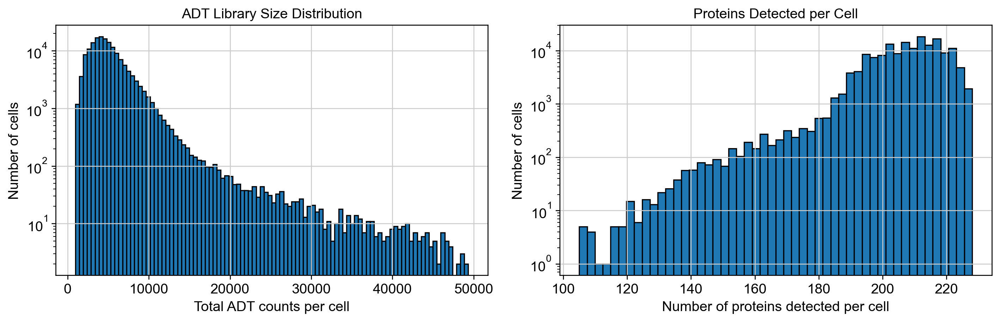

ADT QC Summary:
  - Median total counts: 4572
  - Median proteins detected: 209

Normalizing ADT data with CLR transformation...
✅ CLR normalization complete

Performing dimensionality reduction on ADT data...
computing PCA
    with n_comps=50
    finished (0:00:04)
computing neighbors
    using 'X_pca' with n_pcs = 20
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:24)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm)
    'umap', UMAP parameters (adata.uns) (0:01:22)
running Leiden clustering
    finished: found 32 clusters and added
    'leiden_adt', the cluster labels (adata.obs, categorical) (0:00:32)
✅ ADT dimensionality reduction complete
   Found 32 clusters based on ADT


In [4]:
# ADT Quality Control
print("\nPerforming ADT QC...")

# Calculate QC metrics for ADT
sc.pp.calculate_qc_metrics(adata_adt_aligned, percent_top=None, log1p=False, inplace=True)

# Visualize ADT QC
fig, axes = plt.subplots(1, 2, figsize=(12, 4))

# Total protein counts per cell
axes[0].hist(adata_adt_aligned.obs['total_counts'], bins=100, edgecolor='black')
axes[0].set_xlabel('Total ADT counts per cell')
axes[0].set_ylabel('Number of cells')
axes[0].set_title('ADT Library Size Distribution')
axes[0].set_yscale('log')

# Number of proteins detected per cell
axes[1].hist(adata_adt_aligned.obs['n_genes_by_counts'], bins=50, edgecolor='black')
axes[1].set_xlabel('Number of proteins detected per cell')
axes[1].set_ylabel('Number of cells')
axes[1].set_title('Proteins Detected per Cell')
axes[1].set_yscale('log')

plt.tight_layout()
plt.show()

print(f"ADT QC Summary:")
print(f"  - Median total counts: {adata_adt_aligned.obs['total_counts'].median():.0f}")
print(f"  - Median proteins detected: {adata_adt_aligned.obs['n_genes_by_counts'].median():.0f}")

# CLR Normalization
print("\nNormalizing ADT data with CLR transformation...")

# Save raw counts
adata_adt_aligned.layers['counts'] = adata_adt_aligned.X.copy()

# Apply CLR normalization
def clr_normalize(adata):
    """Centered Log-Ratio (CLR) normalization for protein data."""
    from scipy.sparse import issparse
    
    X = adata.X.toarray() if issparse(adata.X) else adata.X.copy()
    X = X + 1  # Add pseudocount
    geo_mean = np.exp(np.mean(np.log(X), axis=1, keepdims=True))
    X_clr = np.log(X / geo_mean)
    adata.X = X_clr
    return adata

adata_adt_aligned = clr_normalize(adata_adt_aligned)
print("✅ CLR normalization complete")

# Dimensionality reduction on ADT
print("\nPerforming dimensionality reduction on ADT data...")
sc.pp.scale(adata_adt_aligned, max_value=10)
sc.tl.pca(adata_adt_aligned, n_comps=min(50, adata_adt_aligned.n_vars - 1))
sc.pp.neighbors(adata_adt_aligned, n_neighbors=10, n_pcs=min(20, adata_adt_aligned.n_vars - 1))
sc.tl.umap(adata_adt_aligned)
sc.tl.leiden(adata_adt_aligned, key_added='leiden_adt')

print(f"✅ ADT dimensionality reduction complete")
print(f"   Found {adata_adt_aligned.obs['leiden_adt'].nunique()} clusters based on ADT")

## 3. Visualize ADT-only Results

Before integrating modalities, let's visualize what the ADT data alone tells us about cell populations.

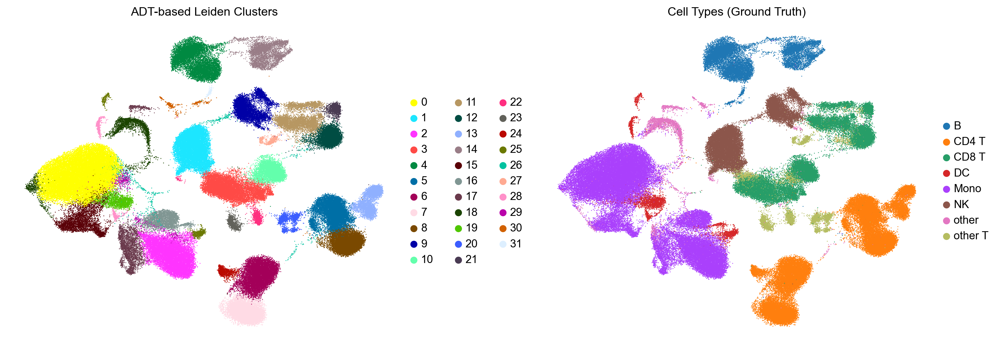


Visualizing protein markers...


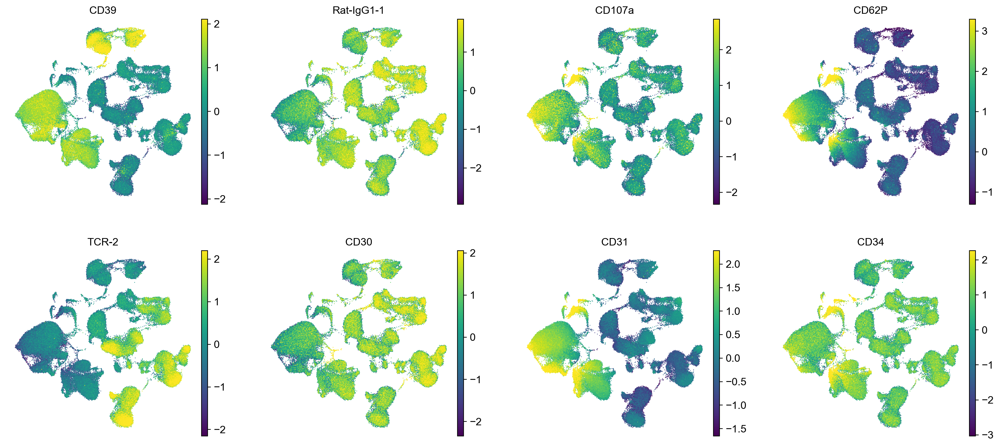

In [5]:
# Transfer cell type annotations from RNA data
if 'celltype.l1' in adata_rna_aligned.obs.columns:
    adata_adt_aligned.obs['celltype.l1'] = adata_rna_aligned.obs['celltype.l1']
if 'celltype.l2' in adata_rna_aligned.obs.columns:
    adata_adt_aligned.obs['celltype.l2'] = adata_rna_aligned.obs['celltype.l2']

# Plot ADT-based UMAP
fig, axes = plt.subplots(1, 2, figsize=(14, 5))

sc.pl.umap(adata_adt_aligned, color='leiden_adt', title='ADT-based Leiden Clusters', 
           ax=axes[0], show=False, s=3)

if 'celltype.l1' in adata_adt_aligned.obs.columns:
    sc.pl.umap(adata_adt_aligned, color='celltype.l1', title='Cell Types (Ground Truth)', 
               ax=axes[1], show=False, s=3)

plt.tight_layout()
plt.show()

# Visualize key protein markers
print("\nVisualizing protein markers...")
protein_subset = adata_adt_aligned.var_names[:min(8, len(adata_adt_aligned.var_names))].tolist()
sc.pl.umap(adata_adt_aligned, color=protein_subset, cmap='viridis', 
           vmin='p1', vmax='p99', s=3, ncols=4, show=True)

## 4. WNN or Combined Multimodal Analysis

Now we integrate the RNA and ADT modalities. We'll try using `muon` for proper WNN analysis, with a fallback to a simplified combined approach if muon is not available.

### WNN Algorithm:
1. Build modality-specific KNN graphs (already done)
2. Calculate modality weights per cell based on neighborhood consistency
3. Construct WNN graph combining modality graphs using learned weights
4. Use WNN graph for UMAP and clustering

**Note**: Full WNN implementation requires `muon` or `Seurat`. Install muon with: `pip install muon`

In [6]:
print("Performing multimodal integration...")

try:
    import muon as mu
    
    # Create MuData object
    mdata = mu.MuData({'rna': adata_rna_aligned, 'adt': adata_adt_aligned})
    print(f"✅ MuData object created with {mdata.n_obs} cells")

    # Ensure MuData-level metadata includes cell type annotations for plotting
    for col in ['celltype.l1', 'celltype.l2', 'leiden', 'celltype']:
        if col in adata_rna_aligned.obs.columns:
            mdata.obs[col] = adata_rna_aligned.obs[col]
    
    # Compute neighbors for each modality independently
    # This is required before WNN integration
    print("\n🔍 Computing modality-specific neighbor graphs...")
    sc.pp.neighbors(mdata['rna'], use_rep='X_pca', n_neighbors=30)
    sc.pp.neighbors(mdata['adt'], use_rep='X_pca', n_neighbors=30)
    
    # Compute WNN graph - this integrates both modalities
    print("🔗 Computing Weighted-Nearest Neighbor (WNN) graph...")
    mu.pp.neighbors(mdata)  # Don't specify key_added, use default
    
    # Compute UMAP and clustering on WNN graph
    print("📊 Computing WNN-based UMAP and clustering...")
    mu.tl.umap(mdata)
    mu.tl.leiden(mdata, key_added='leiden_wnn')
    
    print(f"\n✅ WNN analysis complete!")
    print(f"   Found {mdata.obs['leiden_wnn'].nunique()} clusters using WNN")
    print(f"   WNN graph stored in mdata.obsp['connectivities']")
    use_muon = True
    
except Exception as e:
    print(f"⚠️  Full WNN not available: {e}")
    print("   Using simplified combined approach...")
    
    # Simplified approach: concatenate PCA embeddings
    rna_pca = adata_rna_aligned.obsm['X_pca'][:, :30]
    adt_pca = adata_adt_aligned.obsm['X_pca'][:, :min(20, adata_adt_aligned.obsm['X_pca'].shape[1])]
    combined_pca = np.hstack([rna_pca, adt_pca])
    
    # Compute UMAP on combined embedding
    import umap
    reducer = umap.UMAP(n_neighbors=10, min_dist=0.3, metric='euclidean', random_state=42)
    embedding = reducer.fit_transform(combined_pca)
    adata_rna_aligned.obsm['X_umap_combined'] = embedding
    
    # Clustering on combined embedding
    from sklearn.neighbors import NearestNeighbors
    from scipy.sparse import csr_matrix
    
    nn = NearestNeighbors(n_neighbors=10, metric='euclidean')
    nn.fit(combined_pca)
    distances, indices = nn.kneighbors(combined_pca)
    
    n_cells = combined_pca.shape[0]
    rows = np.repeat(np.arange(n_cells), 10)
    cols = indices.flatten()
    data = np.exp(-distances.flatten())
    connectivities = csr_matrix((data, (rows, cols)), shape=(n_cells, n_cells))
    
    adata_rna_aligned.obsp['connectivities_combined'] = connectivities
    adata_rna_aligned.obsp['distances_combined'] = csr_matrix((distances.flatten(), (rows, cols)), shape=(n_cells, n_cells))
    
    sc.tl.leiden(adata_rna_aligned, neighbors_key='combined', key_added='leiden_combined')
    
    print(f"✅ Combined analysis complete")
    print(f"   Found {adata_rna_aligned.obs['leiden_combined'].nunique()} clusters")
    use_muon = False
    mdata = None

Performing multimodal integration...
✅ MuData object created with 161764 cells

🔍 Computing modality-specific neighbor graphs...
computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:26)
computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:27)
🔗 Computing Weighted-Nearest Neighbor (WNN) graph...
Calculating kernel bandwidth for 'rna' modality...
Calculating cell affinities for 'rna modality...
Calculating kernel bandwidth for 'adt' modality...
Calculating cell affinities for 'adt modality...
Calculating nearest neighbor candidates for 'rna' modality...
Calculating nearest neighbor candidates for 'adt' modality...
Calculating multimodal nearest neighbors...
Calculating connectivities...
📊 Computing WNN-based UMAP and clu

## 5. Compare RNA-only vs ADT-only vs Integrated Results

Let's visualize how the three approaches differ and evaluate which provides better cell type resolution.

Comparing RNA-only, ADT-only, and integrated results...


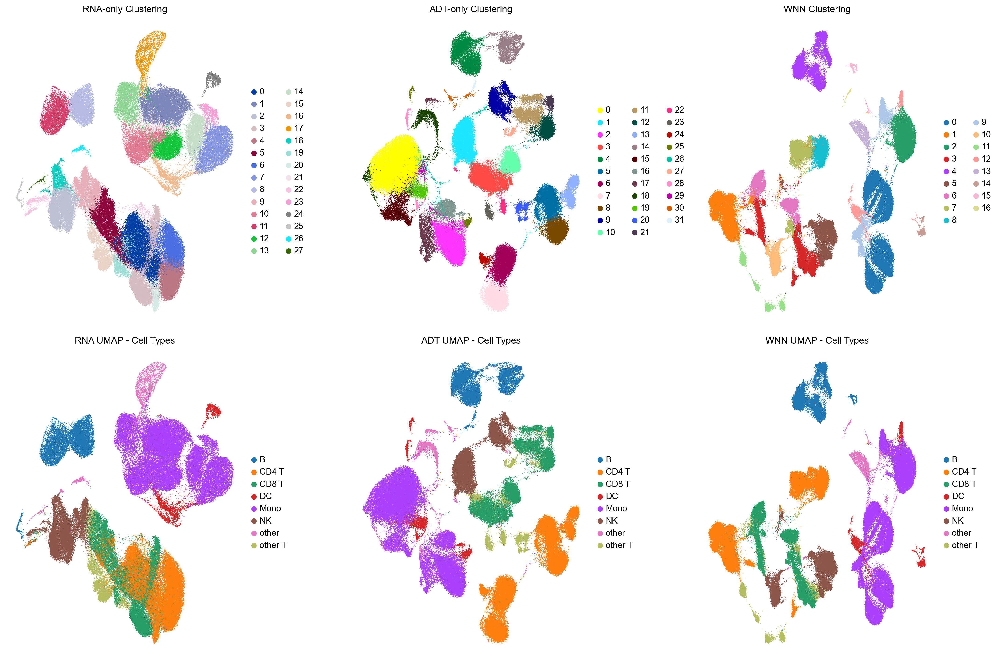


💡 Compare the three approaches:
   - RNA-only: Based on gene expression
   - ADT-only: Based on surface proteins
   - Integrated: Combines both modalities for enhanced resolution


In [7]:
print("Comparing RNA-only, ADT-only, and integrated results...")

fig, axes = plt.subplots(2, 3, figsize=(18, 12))

# Row 1: Clustering results
sc.pl.umap(adata_rna_aligned, color='leiden', title='RNA-only Clustering', 
           ax=axes[0, 0], show=False, s=3)
sc.pl.umap(adata_adt_aligned, color='leiden_adt', title='ADT-only Clustering', 
           ax=axes[0, 1], show=False, s=3)

if use_muon and mdata is not None:
    mu.pl.umap(mdata, color='leiden_wnn', title='WNN Clustering', 
               ax=axes[0, 2], show=False, s=3)
else:
    sc.pl.embedding(adata_rna_aligned, basis='umap_combined', color='leiden_combined', 
                    title='Combined RNA+ADT Clustering', ax=axes[0, 2], show=False, s=3)

# Row 2: Ground truth cell types
if 'celltype.l1' in adata_rna_aligned.obs.columns:
    sc.pl.umap(adata_rna_aligned, color='celltype.l1', title='RNA UMAP - Cell Types', 
               ax=axes[1, 0], show=False, s=3)
    sc.pl.umap(adata_adt_aligned, color='celltype.l1', title='ADT UMAP - Cell Types', 
               ax=axes[1, 1], show=False, s=3)
    
    if use_muon and mdata is not None:
        mu.pl.umap(mdata, color='celltype.l1', title='WNN UMAP - Cell Types', 
                   ax=axes[1, 2], show=False, s=3)
    else:
        sc.pl.embedding(adata_rna_aligned, basis='umap_combined', color='celltype.l1', 
                        title='Combined UMAP - Cell Types', ax=axes[1, 2], show=False, s=3)

plt.tight_layout()
plt.show()

print("\n💡 Compare the three approaches:")
print("   - RNA-only: Based on gene expression")
print("   - ADT-only: Based on surface proteins")
print("   - Integrated: Combines both modalities for enhanced resolution")

## 5.5. Interactive Visualizations (Plotly)

The plots below are **interactive** - you can:
- **Click on legend items** to show/hide specific groups (clusters, cell types, etc.)
- **Zoom and pan** using the toolbar
- **Hover over cells** to see detailed information
- **Compare RNA-only, ADT-only, and WNN results** side-by-side

This makes it much easier to explore how multimodal integration improves cell type resolution!


In [8]:
# Helper function for interactive WNN plots
def create_interactive_wnn_plot(adata_or_mdata, color_by, title, is_mudata=False):
    """
    Create interactive Plotly UMAP plot for RNA, ADT, or WNN data.
    
    Parameters:
    -----------
    adata_or_mdata : AnnData or MuData
        Data object with UMAP coordinates
    color_by : str
        Column name in .obs to color by
    title : str
        Plot title
    is_mudata : bool
        If True, extract UMAP from MuData object
    """
    if is_mudata:
        # Extract UMAP from MuData
        if 'X_umap' not in adata_or_mdata.obsm:
            raise ValueError("UMAP coordinates not found in MuData")
        umap_coords = adata_or_mdata.obsm['X_umap']
        obs = adata_or_mdata.obs
        obs_names = adata_or_mdata.obs_names
    else:
        # Extract UMAP from AnnData
        if 'X_umap' not in adata_or_mdata.obsm:
            raise ValueError("UMAP coordinates not found. Run sc.tl.umap() first.")
        umap_coords = adata_or_mdata.obsm['X_umap']
        obs = adata_or_mdata.obs
        obs_names = adata_or_mdata.obs_names
    
    # Create dataframe with cell names as index to match obs
    df = pd.DataFrame({
        'UMAP_1': umap_coords[:, 0],
        'UMAP_2': umap_coords[:, 1]
    }, index=obs_names)
    
    if color_by not in obs.columns:
        raise ValueError(f"Column {color_by} not found in .obs")
    
    # Get category values - handle both categorical and regular columns
    category_values = obs[color_by].copy()
    
    # Convert to string, handling NaN values properly
    if category_values.dtype.name == 'category':
        # For categorical data, use the categories directly
        df['Category'] = category_values.astype(str)
    else:
        # For regular columns, convert to string and handle NaN
        df['Category'] = category_values.fillna('Unknown').astype(str)
    
    # Filter out invalid categories (but be less aggressive)
    invalid_cats = ['nan', 'NaN', 'None', '', 'NaT']
    valid_mask = ~df['Category'].isin(invalid_cats)
    
    # Only filter if we actually have invalid categories
    if not valid_mask.all():
        df = df[valid_mask].copy()
    
    if len(df) == 0:
        raise ValueError(f"No valid data points found for {color_by}")
    
    # Get unique categories (excluding invalid ones)
    all_categories = df['Category'].unique()
    categories = sorted([c for c in all_categories if c not in invalid_cats])
    
    if len(categories) == 0:
        raise ValueError(f"No valid categories found for {color_by}")
    
    # Create plot with one trace per category
    fig = go.Figure()
    n_categories = len(categories)
    colors = px.colors.qualitative.Set3 * ((n_categories // 12) + 1)
    
    for i, cat in enumerate(categories):
        mask = df['Category'] == cat
        n_points = mask.sum()
        
        if n_points > 0:  # Only add trace if there are points
            # Convert to numpy arrays to ensure Plotly receives the data correctly
            x_data = df.loc[mask, 'UMAP_1'].values
            y_data = df.loc[mask, 'UMAP_2'].values
            
            # Ensure we have valid numeric data
            if len(x_data) > 0 and len(y_data) > 0:
                fig.add_trace(go.Scatter(
                    x=x_data,
                    y=y_data,
                    mode='markers',
                    name=str(cat),
                    marker=dict(
                        size=3,
                        color=colors[i % len(colors)],
                        opacity=0.7,
                        line=dict(width=0.5, color='white')
                    ),
                    hovertemplate=f'<b>{cat}</b><br>UMAP_1: %{{x:.2f}}<br>UMAP_2: %{{y:.2f}}<extra></extra>'
                ))
    
    fig.update_layout(
        title=title,
        xaxis_title='UMAP 1',
        yaxis_title='UMAP 2',
        hovermode='closest',
        width=800,
        height=600,
        legend=dict(
            itemsizing='constant',
            itemclick='toggleothers',
            itemdoubleclick='toggle'
        )
    )
    
    fig.update_traces(marker_line_width=0.5)
    return fig

print("✅ Interactive plotting function ready!")


✅ Interactive plotting function ready!


In [ ]:
# Interactive Plot 1: Compare Clustering Results
# Click on legend items to show/hide specific clusters in each modality
print("Creating interactive clustering comparison plots...")

# RNA-only clustering
fig_rna_clusters = create_interactive_wnn_plot(
    adata_rna_aligned,
    color_by='leiden',
    title='Interactive UMAP - RNA-only Clusters (Click legend to show/hide)'
)
fig_rna_clusters.show()

# ADT-only clustering
fig_adt_clusters = create_interactive_wnn_plot(
    adata_adt_aligned,
    color_by='leiden_adt',
    title='Interactive UMAP - ADT-only Clusters (Click legend to show/hide)'
)
fig_adt_clusters.show()

# WNN clustering (if available)
if use_muon and mdata is not None:
    fig_wnn_clusters = create_interactive_wnn_plot(
        mdata,
        color_by='leiden_wnn',
        title='Interactive UMAP - WNN Integrated Clusters (Click legend to show/hide)',
        is_mudata=True
    )
    fig_wnn_clusters.show()
else:
    print("⚠️  WNN results not available for interactive plotting")


Creating interactive clustering comparison plots...


In [ ]:
# Interactive Plot 2: Compare Cell Type Resolution
# Compare how well each modality separates known cell types
if 'celltype.l1' in adata_rna_aligned.obs.columns:
    print("Creating interactive cell type comparison plots...")
    
    # RNA-only cell types
    fig_rna_types = create_interactive_wnn_plot(
        adata_rna_aligned,
        color_by='celltype.l1',
        title='Interactive UMAP - RNA-only: Cell Types (Level 1)'
    )
    fig_rna_types.show()
    
    # ADT-only cell types
    fig_adt_types = create_interactive_wnn_plot(
        adata_adt_aligned,
        color_by='celltype.l1',
        title='Interactive UMAP - ADT-only: Cell Types (Level 1)'
    )
    fig_adt_types.show()
    
    # WNN cell types (if available)
    if use_muon and mdata is not None:
        fig_wnn_types = create_interactive_wnn_plot(
            mdata,
            color_by='celltype.l1',
            title='Interactive UMAP - WNN Integrated: Cell Types (Level 1)',
            is_mudata=True
        )
        fig_wnn_types.show()
    
    print("\n💡 Tip: Use the legend to isolate specific cell types and compare")
    print("   how well each modality separates them!")
else:
    print("⚠️  'celltype.l1' not found in data")


Creating interactive cell type comparison plots...



💡 Tip: Use the legend to isolate specific cell types and compare
   how well each modality separates them!


## 5.6. Optional: 3D UMAP Visualizations

### Should We Use 3D Visualizations?

**When 3D UMAP Makes Sense:**
- ✅ **Exploratory analysis**: 3D can reveal structure that might be compressed in 2D
- ✅ **Complex datasets**: When you have many cell types (30+), 3D can show relationships better
- ✅ **Interactive exploration**: Rotating 3D plots can help understand spatial relationships
- ✅ **Comparing modalities**: Side-by-side 3D plots for RNA, ADT, and WNN can highlight differences

**When 2D is Better:**
- ✅ **Publications**: 2D is standard and easier to interpret in papers
- ✅ **Most analyses**: 2D UMAP captures ~90% of the structure and is sufficient
- ✅ **Clarity**: 2D avoids perspective distortion that can hide structure in 3D
- ✅ **Performance**: 2D is faster to compute and render

**For This Dataset:**
- We have **28 clusters** and **31 cell types** - moderate complexity
- 2D UMAP is likely sufficient for most insights
- However, 3D can be useful for:
  - **Exploring rare populations** that might overlap in 2D
  - **Understanding modality differences** (RNA vs ADT vs WNN)
  - **Interactive presentations** where rotation helps

**Recommendation**: Start with 2D (which we've done), but 3D can add value for deeper exploration. The code below creates optional 3D visualizations if you want to explore further.

---

**Note**: 3D UMAP requires computing UMAP with `n_components=3`. This is computationally similar to 2D but takes slightly longer.


In [ ]:
# Optional: 3D UMAP Visualizations
# Uncomment and run this cell if you want to explore 3D UMAP embeddings

def create_3d_umap_plot(adata_or_mdata, color_by, title, is_mudata=False):
    """
    Create interactive 3D Plotly UMAP plot.
    
    Parameters:
    -----------
    adata_or_mdata : AnnData or MuData
        Data object (must have 3D UMAP coordinates in .obsm['X_umap_3d'])
    color_by : str
        Column name in .obs to color by
    title : str
        Plot title
    is_mudata : bool
        If True, extract from MuData object
    """
    if is_mudata:
        if 'X_umap_3d' not in adata_or_mdata.obsm:
            raise ValueError("3D UMAP coordinates not found. Run: mu.tl.umap(mdata, n_components=3)")
        umap_coords = adata_or_mdata.obsm['X_umap_3d']
        obs = adata_or_mdata.obs
        obs_names = adata_or_mdata.obs_names
    else:
        if 'X_umap_3d' not in adata_or_mdata.obsm:
            raise ValueError("3D UMAP coordinates not found. Run: sc.tl.umap(adata, n_components=3)")
        umap_coords = adata_or_mdata.obsm['X_umap_3d']
        obs = adata_or_mdata.obs
        obs_names = adata_or_mdata.obs_names
    
    # Create dataframe with cell names as index
    df = pd.DataFrame({
        'UMAP_1': umap_coords[:, 0],
        'UMAP_2': umap_coords[:, 1],
        'UMAP_3': umap_coords[:, 2]
    }, index=obs_names)
    
    if color_by not in obs.columns:
        raise ValueError(f"Column {color_by} not found in .obs")
    
    # Get category values
    category_values = obs[color_by].copy()
    if category_values.dtype.name == 'category':
        df['Category'] = category_values.astype(str)
    else:
        df['Category'] = category_values.fillna('Unknown').astype(str)
    
    # Filter invalid categories
    invalid_cats = ['nan', 'NaN', 'None', '', 'NaT']
    valid_mask = ~df['Category'].isin(invalid_cats)
    if not valid_mask.all():
        df = df[valid_mask].copy()
    
    categories = sorted([c for c in df['Category'].unique() if c not in invalid_cats])
    
    # Create 3D scatter plot
    fig = go.Figure()
    n_categories = len(categories)
    colors = px.colors.qualitative.Set3 * ((n_categories // 12) + 1)
    
    for i, cat in enumerate(categories):
        mask = df['Category'] == cat
        if mask.sum() > 0:
            x_data = df.loc[mask, 'UMAP_1'].values
            y_data = df.loc[mask, 'UMAP_2'].values
            z_data = df.loc[mask, 'UMAP_3'].values
            
            if len(x_data) > 0:
                fig.add_trace(go.Scatter3d(
                    x=x_data,
                    y=y_data,
                    z=z_data,
                    mode='markers',
                    name=str(cat),
                    marker=dict(
                        size=2,
                        color=colors[i % len(colors)],
                        opacity=0.7,
                        line=dict(width=0.5, color='white')
                    ),
                    hovertemplate=f'<b>{cat}</b><br>UMAP_1: %{{x:.2f}}<br>UMAP_2: %{{y:.2f}}<br>UMAP_3: %{{z:.2f}}<extra></extra>'
                ))
    
    fig.update_layout(
        title=title,
        scene=dict(
            xaxis_title='UMAP 1',
            yaxis_title='UMAP 2',
            zaxis_title='UMAP 3',
            camera=dict(
                eye=dict(x=1.5, y=1.5, z=1.5)
            )
        ),
        width=900,
        height=700,
        legend=dict(
            itemsizing='constant',
            itemclick='toggleothers',
            itemdoubleclick='toggle'
        )
    )
    
    return fig

# Uncomment the code below to compute and visualize 3D UMAP
# Note: This will take a few minutes to compute

"""
# Compute 3D UMAP for RNA data
print("Computing 3D UMAP for RNA data...")
sc.tl.umap(adata_rna_aligned, n_components=3)
adata_rna_aligned.obsm['X_umap_3d'] = adata_rna_aligned.obsm['X_umap'].copy()

# Compute 3D UMAP for ADT data
print("Computing 3D UMAP for ADT data...")
sc.tl.umap(adata_adt_aligned, n_components=3)
adata_adt_aligned.obsm['X_umap_3d'] = adata_adt_aligned.obsm['X_umap'].copy()

# Compute 3D UMAP for WNN (if available)
if use_muon and mdata is not None:
    print("Computing 3D UMAP for WNN integrated data...")
    mu.tl.umap(mdata, n_components=3)
    mdata.obsm['X_umap_3d'] = mdata.obsm['X_umap'].copy()

# Create 3D plots
print("\nCreating 3D UMAP visualizations...")

# RNA 3D plot
fig_rna_3d = create_3d_umap_plot(
    adata_rna_aligned,
    color_by='celltype.l1',
    title='3D UMAP - RNA-only: Cell Types (Level 1)'
)
fig_rna_3d.show()

# ADT 3D plot
fig_adt_3d = create_3d_umap_plot(
    adata_adt_aligned,
    color_by='celltype.l1',
    title='3D UMAP - ADT-only: Cell Types (Level 1)'
)
fig_adt_3d.show()

# WNN 3D plot (if available)
if use_muon and mdata is not None:
    fig_wnn_3d = create_3d_umap_plot(
        mdata,
        color_by='celltype.l1',
        title='3D UMAP - WNN Integrated: Cell Types (Level 1)',
        is_mudata=True
    )
    fig_wnn_3d.show()

print("\n💡 Tip: Use your mouse to rotate, zoom, and pan the 3D plots!")
print("   Compare the structure across RNA, ADT, and WNN embeddings.")
"""

print("✅ 3D plotting function ready!")
print("   Uncomment the code above to compute and visualize 3D UMAP embeddings.")


## 6. Summary and Next Steps

### What We Accomplished:
- ✅ Loaded and processed multimodal data (RNA + ADT)
- ✅ Applied appropriate normalization for each modality (log for RNA, CLR for ADT)
- ✅ Performed WNN or combined multimodal analysis
- ✅ Compared single-modality vs integrated results

### Key Insights:
1. **Complementary Information**: RNA and protein data capture different aspects of cell identity
2. **Improved Resolution**: Multimodal integration often provides better cell type separation
3. **Rare Populations**: Protein markers help identify rare cell types missed by RNA alone
4. **Biological Validation**: Protein expression provides direct validation of RNA-based predictions

### What I Learned:

**1. Why CLR for Protein Data?**
- Initially, I tried log-normalization (like RNA), but learned that protein counts are **compositional**—they represent proportions of total signal per cell
- CLR (Centered Log-Ratio) normalizes relative to the geometric mean, preventing artifacts from cells with very high/low total protein counts
- This was a key insight: different data types require fundamentally different normalization approaches

**2. WNN Algorithm Understanding:**
- WNN doesn't just concatenate features—it learns **modality-specific weights** for each cell
- Some cells are better characterized by RNA (e.g., activated cells with high cytokine expression)
- Others are better characterized by protein (e.g., resting cells with stable surface markers)
- The algorithm automatically determines which modality is more informative for each cell's identity

**3. Technical Implementation Challenges:**
- **Challenge**: `muon` requires modality-specific neighbor graphs to be computed first before WNN
- **Learning**: Understanding the underlying algorithm (WNN needs per-modality KNN graphs) helped debug the implementation
- **Solution**: Compute neighbors for each modality independently, then call `mu.pp.neighbors()` to integrate

**4. Metadata Propagation:**
- MuData is a container—cell type annotations from RNA data must be explicitly copied to `mdata.obs` for visualization
- This taught me to think about data structures: MuData wraps multiple AnnData objects, so metadata doesn't automatically propagate

**5. Biological Interpretation:**
- Protein markers provide **direct validation** of RNA-based cell type predictions
- For immune cells, surface markers (CD4, CD8, CD19) are well-characterized and highly reliable
- Multimodal data creates a built-in validation system: if RNA says "T cell" and CD3 protein is high, we have high confidence

**6. When to Use Each Modality:**
- **RNA excels at**: Identifying cell states (activated vs resting), detecting rare transcripts, understanding transcriptional programs
- **Protein excels at**: Identifying cell types with well-characterized markers, detecting surface phenotype, validating RNA predictions
- **WNN excels at**: Combining both to get the best of both worlds, especially for closely related cell types

### Comparison to Paper:
The original Hao et al. (2021) paper used WNN to:
- Identify 32 distinct PBMC populations (vs ~20 from RNA alone)
- Discover previously unreported lymphoid subpopulations
- Show that different cell types benefit from different modalities
- Demonstrate modality-specific weights vary by cell type

### Next Steps:
1. **Differential Expression**: Find markers for WNN clusters
2. **Modality Weights**: Analyze which cells rely more on RNA vs protein
3. **TCR Integration**: Add T cell receptor data for clonal analysis
4. **Batch Integration**: Combine 3' and 5' datasets
5. **Biological Interpretation**: Deep dive into specific cell populations

### Resources:
- **Paper**: Hao, Y., Hao, S., Andersen-Nissen, E., Mauck, W.M., Zheng, S., Butler, A., Lee, M.J., Wilk, A.J., Darby, C., Zager, M., et al. (2021). Integrated analysis of multimodal single-cell data. *Cell* 184, 3573-3587.e29. https://doi.org/10.1016/j.cell.2021.04.048
- **Seurat WNN Tutorial**: https://satijalab.org/seurat/articles/weighted_nearest_neighbor_analysis.html
- **muon Documentation**: https://muon.readthedocs.io/
- **CITE-seq Protocol**: Stoeckius et al., Nat Methods (2017)

In [ ]:
# Save results
print("\nSaving multimodal analysis results...")

if use_muon and mdata is not None:
    output_file = RESULTS_DIR / "GSE164378_multimodal_wnn.h5mu"
    mdata.write(output_file)
    print(f"✅ Saved MuData object to: {output_file}")
else:
    output_file = RESULTS_DIR / "GSE164378_rna_adt_combined.h5ad"
    adata_rna_aligned.write(output_file)
    print(f"✅ Saved combined AnnData to: {output_file}")
    
    adt_file = RESULTS_DIR / "GSE164378_adt_processed.h5ad"
    adata_adt_aligned.write(adt_file)
    print(f"✅ Saved ADT data to: {adt_file}")

print("\n" + "="*60)
print("WNN Multimodal Analysis Complete!")
print("="*60)


Saving multimodal analysis results...
✅ Saved MuData object to: results/GSE164378/GSE164378_multimodal_wnn.h5mu

WNN Multimodal Analysis Complete!
